In [149]:
import os
from glob import glob # extract path of each file
import pandas as pd # data preprocessing
from xml.etree import ElementTree as et # parse information from XML
from functools import reduce

In [150]:
import warnings
warnings.filterwarnings('ignore')

In [151]:
# step-1: get path of each xml file
xmlfiles = glob('./dataset/*.xml')
# replace \\ with /
replace_text = lambda x: x.replace('\\','/')
xmlfiles = list(map(replace_text,xmlfiles))

In [152]:
xmlfiles

['./dataset/car0.xml',
 './dataset/Car1.xml',
 './dataset/Car10.xml',
 './dataset/Car100.xml',
 './dataset/Car101.xml',
 './dataset/Car102.xml',
 './dataset/Car103.xml',
 './dataset/Car104.xml',
 './dataset/Car105.xml',
 './dataset/Car106.xml',
 './dataset/Car107.xml',
 './dataset/Car108.xml',
 './dataset/Car109.xml',
 './dataset/Car11.xml',
 './dataset/Car110.xml',
 './dataset/Car111.xml',
 './dataset/Car112.xml',
 './dataset/Car113.xml',
 './dataset/Car114.xml',
 './dataset/Car115.xml',
 './dataset/Car116.xml',
 './dataset/Car117.xml',
 './dataset/Car118.xml',
 './dataset/Car119.xml',
 './dataset/Car12.xml',
 './dataset/Car120.xml',
 './dataset/Car121.xml',
 './dataset/Car122.xml',
 './dataset/Car123.xml',
 './dataset/Car124.xml',
 './dataset/Car125.xml',
 './dataset/Car126.xml',
 './dataset/Car127.xml',
 './dataset/Car128.xml',
 './dataset/Car129.xml',
 './dataset/Car13.xml',
 './dataset/Car130.xml',
 './dataset/Car131.xml',
 './dataset/Car132.xml',
 './dataset/Car133.xml',
 './data

In [153]:
# step-2: read xml files
# from each xml file we need to extract
# filename, size(width, height), object(name, xmin, xmax, ymin, ymax)
def extract_text(filename):
    tree = et.parse(filename)
    root = tree.getroot()

    # extract filename
    image_name = root.find('filename').text
    # width and height of the image
    width = root.find('size').find('width').text
    height = root.find('size').find('height').text
    objs = root.findall('object')
    parser = []
    for obj in objs:
        name = obj.find('name').text
        bndbox = obj.find('bndbox')
        xmin = bndbox.find('xmin').text
        xmax = bndbox.find('xmax').text
        ymin = bndbox.find('ymin').text
        ymax = bndbox.find('ymax').text
        parser.append([image_name, width, height, name,xmin,xmax,ymin,ymax])
        
    return parser

In [154]:
parser_all = list(map(extract_text,xmlfiles))

In [155]:
data = reduce(lambda x, y : x+y,parser_all)

In [156]:
df = pd.DataFrame(data,columns = ['filename','width','height','name','xmin','xmax','ymin','ymax'])

In [157]:
df.head()

,filename,width,height,name,xmin,xmax,ymin,ymax
0,car0.jpg,3072,4096,number_plate,1147,1597,1893,2171
1,car0.jpg,3072,4096,logo,1247,1502,1657,1798
2,car0.jpg,3072,4096,signal_lights,506,906,1625,1961
3,car0.jpg,3072,4096,signal_lights,1865,2524,1825,2125
4,Car1.jpg,3072,4096,number_plate,822,1247,1751,1960


In [158]:
df.shape

(1197, 8)

In [159]:
df['name'].value_counts()

name
signal_lights    596
logo             302
number_plate     299
Name: count, dtype: int64

#### Conversion
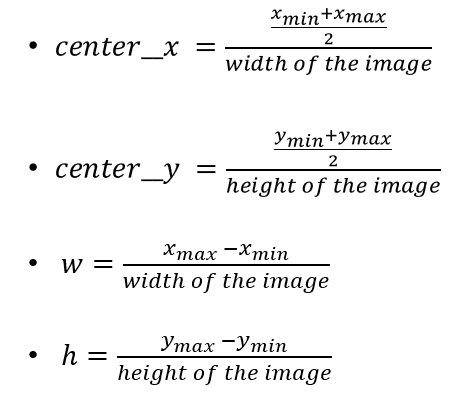

In [160]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1197 entries, 0 to 1196
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  1197 non-null   object
 1   width     1197 non-null   object
 2   height    1197 non-null   object
 3   name      1197 non-null   object
 4   xmin      1197 non-null   object
 5   xmax      1197 non-null   object
 6   ymin      1197 non-null   object
 7   ymax      1197 non-null   object
dtypes: object(8)
memory usage: 74.9+ KB


In [161]:
# type conversion
cols = ['width','height','xmin','xmax','ymin','ymax']
df[cols] = df[cols].astype(int)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1197 entries, 0 to 1196
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  1197 non-null   object
 1   width     1197 non-null   int64 
 2   height    1197 non-null   int64 
 3   name      1197 non-null   object
 4   xmin      1197 non-null   int64 
 5   xmax      1197 non-null   int64 
 6   ymin      1197 non-null   int64 
 7   ymax      1197 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 74.9+ KB


In [162]:
# center x, center y
df['center_x'] = ((df['xmax']+df['xmin'])/2)/df['width']
df['center_y'] = ((df['ymax']+df['ymin'])/2)/df['height']
# w 
df['w'] = (df['xmax']-df['xmin'])/df['width']
# h 
df['h'] = (df['ymax']-df['ymin'])/df['height']

In [163]:
df.head()

,filename,width,height,name,xmin,xmax,ymin,ymax,center_x,center_y,w,h
0,car0.jpg,3072,4096,number_plate,1147,1597,1893,2171,0.446615,0.496094,0.146484,0.067871
1,car0.jpg,3072,4096,logo,1247,1502,1657,1798,0.447428,0.421753,0.083008,0.034424
2,car0.jpg,3072,4096,signal_lights,506,906,1625,1961,0.229818,0.437744,0.130208,0.082031
3,car0.jpg,3072,4096,signal_lights,1865,2524,1825,2125,0.714355,0.482178,0.214518,0.073242
4,Car1.jpg,3072,4096,number_plate,822,1247,1751,1960,0.336751,0.453003,0.138346,0.051025


### split data into train and test

In [164]:
images = df['filename'].unique()

In [165]:
len(images)

301

In [166]:
# 80 train and 10 % val and 10% test

# 80% train and 10% val and 10% test
img_df = pd.DataFrame(images, columns=['filename'])
img_train = tuple(img_df.sample(frac=0.8)['filename']) # shuffle and pick 80% of images
img_val = tuple(img_df.query(f'filename not in {img_train}').sample(frac=0.5)['filename']) # shuffle and pick 50% of remaining images
img_test = tuple(img_df.query(f'filename not in {img_train} and filename not in {img_val}')['filename']) # take rest 10% images

# check the length of each set
len(img_train), len(img_val), len(img_test) 

(241, 30, 30)

In [167]:
train_df = df.query(f'filename in {img_train}')
test_df = df.query(f'filename in {img_test}')
val_df = df.query(f'filename in {img_val}')

In [168]:
train_df.head()

,filename,width,height,name,xmin,xmax,ymin,ymax,center_x,center_y,w,h
0,car0.jpg,3072,4096,number_plate,1147,1597,1893,2171,0.446615,0.496094,0.146484,0.067871
1,car0.jpg,3072,4096,logo,1247,1502,1657,1798,0.447428,0.421753,0.083008,0.034424
2,car0.jpg,3072,4096,signal_lights,506,906,1625,1961,0.229818,0.437744,0.130208,0.082031
3,car0.jpg,3072,4096,signal_lights,1865,2524,1825,2125,0.714355,0.482178,0.214518,0.073242
4,Car1.jpg,3072,4096,number_plate,822,1247,1751,1960,0.336751,0.453003,0.138346,0.051025


In [169]:
test_df.head()

,filename,width,height,name,xmin,xmax,ymin,ymax,center_x,center_y,w,h
16,Car101.jpg,3072,4096,number_plate,1354,1674,1726,1921,0.492839,0.445190,0.104167,0.047607
17,Car101.jpg,3072,4096,signal_lights,815,1079,1661,1914,0.308268,0.436401,0.085938,0.061768
18,Car101.jpg,3072,4096,signal_lights,1966,2257,1654,1895,0.687337,0.433228,0.094727,0.058838
19,Car101.jpg,3072,4096,logo,1464,1554,1614,1688,0.491211,0.403076,0.029297,0.018066
60,Car111.jpg,3072,4096,number_plate,1114,1674,2237,2543,0.453776,0.583496,0.182292,0.074707


In [170]:
val_df.head()

,filename,width,height,name,xmin,xmax,ymin,ymax,center_x,center_y,w,h
12,Car100.jpg,3072,4096,number_plate,1195,1504,1826,1990,0.439290,0.465820,0.100586,0.040039
13,Car100.jpg,3072,4096,signal_lights,637,999,1690,1935,0.266276,0.442505,0.117839,0.059814
14,Car100.jpg,3072,4096,signal_lights,1688,2186,1621,1921,0.630534,0.432373,0.162109,0.073242
15,Car100.jpg,3072,4096,logo,1255,1390,1688,1806,0.430501,0.426514,0.043945,0.028809
32,Car105.jpg,3072,4096,number_plate,1304,1734,2304,2508,0.494466,0.587402,0.139974,0.049805


### Assign id number to object names

In [171]:
# lable encoding
def label_encoding(x):
    labels ={ 'number_plate' :0, 'logo': 1, 'signal_lights': 2}
    return  labels[x]

In [172]:
# Create a new DataFrame column without modifying train_df directly
train_df = train_df.assign(id=train_df['name'].apply(label_encoding))
test_df = test_df.assign(id=test_df['name'].apply(label_encoding))
val_df = val_df.assign(id=val_df['name'].apply(label_encoding))

In [173]:
train_df.head(10)

,filename,width,height,name,xmin,xmax,ymin,ymax,center_x,center_y,w,h,id
0,car0.jpg,3072,4096,number_plate,1147,1597,1893,2171,0.446615,0.496094,0.146484,0.067871,0
1,car0.jpg,3072,4096,logo,1247,1502,1657,1798,0.447428,0.421753,0.083008,0.034424,1
2,car0.jpg,3072,4096,signal_lights,506,906,1625,1961,0.229818,0.437744,0.130208,0.082031,2
3,car0.jpg,3072,4096,signal_lights,1865,2524,1825,2125,0.714355,0.482178,0.214518,0.073242,2
4,Car1.jpg,3072,4096,number_plate,822,1247,1751,1960,0.336751,0.453003,0.138346,0.051025,0
5,Car1.jpg,3072,4096,logo,891,1104,1518,1664,0.324707,0.388428,0.069336,0.035645,1
6,Car1.jpg,3072,4096,signal_lights,1624,2082,1253,1644,0.603190,0.353638,0.149089,0.095459,2
7,Car1.jpg,3072,4096,signal_lights,98,451,1373,1711,0.089355,0.376465,0.114909,0.082520,2
8,Car10.jpg,2571,3056,number_plate,791,1066,1807,1995,0.361144,0.622055,0.106962,0.061518,0
9,Car10.jpg,2571,3056,logo,872,1014,1567,1676,0.366783,0.530596,0.055231,0.035668,1


### Save Image and Labels in text

In [174]:
import os
from shutil import move

In [175]:
train_folder = 'dataset/train'
test_folder = 'dataset/test'
val_folder= 'dataset/val'

# Create folders if they don't exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(test_folder, exist_ok=True)
os.makedirs(val_folder, exist_ok=True)



In [176]:
cols = ['filename','id','center_x','center_y', 'w', 'h']
groupby_obj_train = train_df[cols].groupby('filename')
groupby_obj_test = test_df[cols].groupby('filename')
groupby_obj_val = val_df[cols].groupby('filename')



In [177]:
#groupby_obj_train.get_group('000009.jpg').set_index('filename').to_csv('sample.txt',index=False,header=False)
# save each image in train/test folder and repective labels in .txt
def save_data(filename, folder_path, group_obj):
    # move image
    src = os.path.join('dataset',filename)
    dst = os.path.join(folder_path,filename)
    # Check if the source file exists before moving
    if os.path.exists(src):
        move(src, dst)  # Move image to the destination folder
        
        # Save the labels
        text_filename = os.path.join(folder_path, os.path.splitext(filename)[0] + '.txt')
        group_obj.get_group(filename).set_index('filename').to_csv(text_filename, sep=' ', index=False, header=False)
    else:
        print(f"File {src} not found. Skipping...")

In [178]:
filename_series_val

0     Car107.jpg
1     Car115.jpg
2     Car120.jpg
3     Car123.jpg
4     Car126.jpg
5      Car14.jpg
6       Car2.jpg
7      Car29.jpg
8      Car32.jpg
9       Car4.jpg
10     Car45.jpg
11     Car50.jpg
12     Car53.jpg
13     Car69.jpg
14     Car87.jpg
15     Car89.jpg
16     Car99.jpg
17    car152.jpg
18    car189.jpg
19    car212.jpg
20    car214.jpg
21    car230.jpg
22    car243.jpg
23    car247.jpg
24    car251.jpg
25    car269.jpg
26    car273.jpg
27    car288.jpg
28    car289.jpg
29    car297.jpg
dtype: object

In [179]:
groupby_obj_val.groups.keys()

dict_keys(['Car100.jpg', 'Car105.jpg', 'Car106.jpg', 'Car119.jpg', 'Car139.jpg', 'Car32.jpg', 'Car58.jpg', 'Car61.jpg', 'Car65.jpg', 'Car77.jpg', 'Car82.jpg', 'car148.jpg', 'car174.jpg', 'car180.jpg', 'car188.jpg', 'car190.jpg', 'car199.jpg', 'car201.jpg', 'car211.jpg', 'car229.jpg', 'car236.jpg', 'car243.jpg', 'car246.jpg', 'car262.jpg', 'car263.jpg', 'car264.jpg', 'car276.jpg', 'car278.jpg', 'car286.jpg', 'car296.jpg'])

In [180]:
# Save data for training set
filename_series_train = pd.Series(groupby_obj_train.groups.keys())
filename_series_train.apply(save_data, args=(train_folder, groupby_obj_train))

# Save data for test set
filename_series_test = pd.Series(groupby_obj_test.groups.keys())
filename_series_test.apply(save_data, args=(test_folder, groupby_obj_test))

# Save data for validation set
filename_series_val = pd.Series(groupby_obj_val.groups.keys())
filename_series_val.apply(save_data, args=(val_folder, groupby_obj_val))



0     None
1     None
2     None
3     None
4     None
5     None
6     None
7     None
8     None
9     None
10    None
11    None
12    None
13    None
14    None
15    None
16    None
17    None
18    None
19    None
20    None
21    None
22    None
23    None
24    None
25    None
26    None
27    None
28    None
29    None
dtype: object

In [185]:
# Remove all XML files in the data_images directory and its subdirectories
import glob
for xml_file in glob.glob('dataset/**/*.xml', recursive=True):
    os.remove(xml_file)

# visualizing BBoxes

Processing split: train
Searching for label file for car0.jpg
Expected label: car0.txt
Visualizing car0.jpg in train split


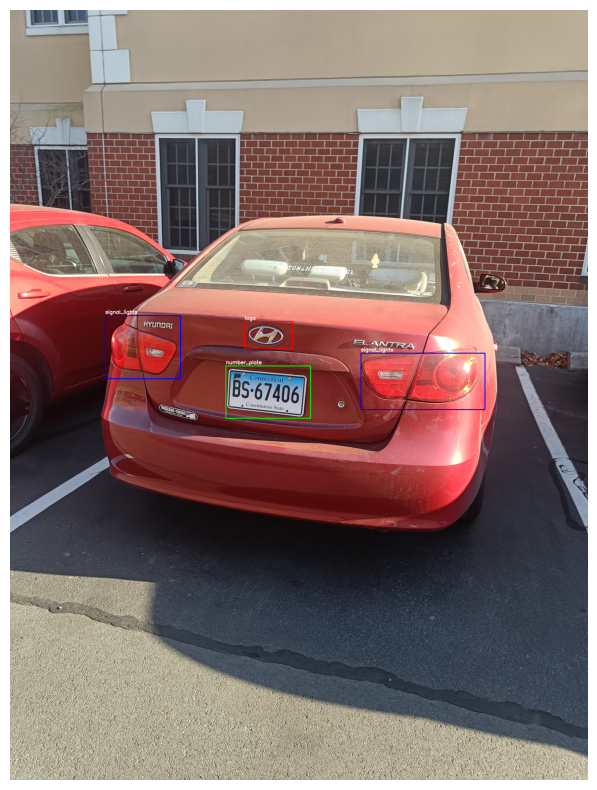

Searching for label file for Car1.jpg
Expected label: Car1.txt
Visualizing Car1.jpg in train split


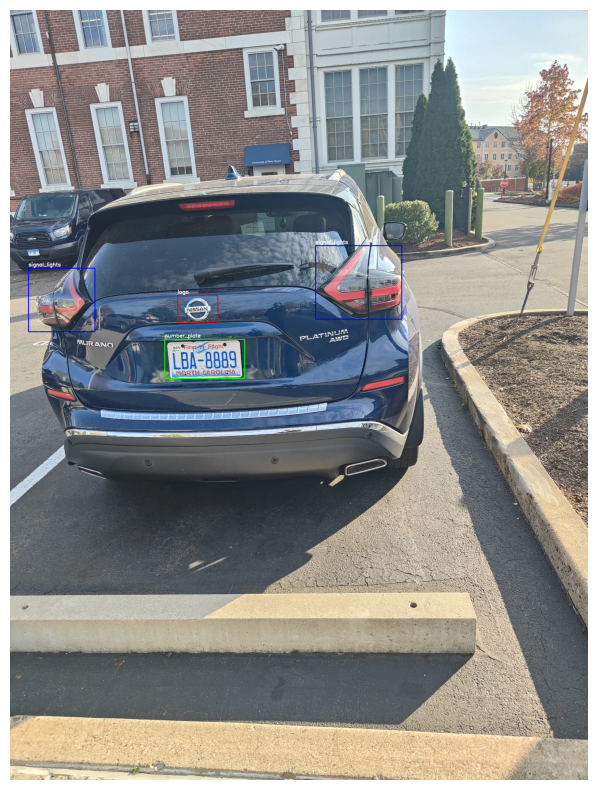

Searching for label file for Car10.jpg
Expected label: Car10.txt
Visualizing Car10.jpg in train split


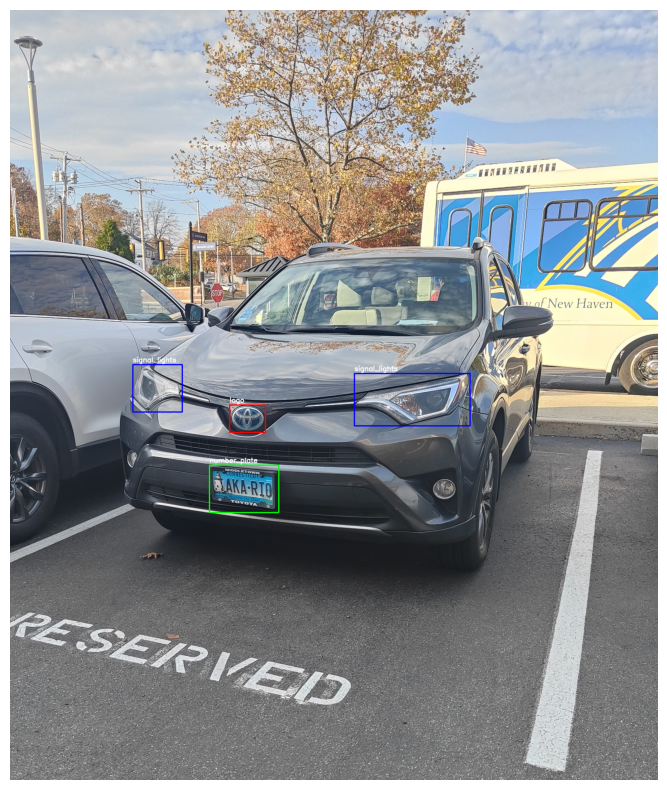

Searching for label file for Car102.jpg
Expected label: Car102.txt
Visualizing Car102.jpg in train split


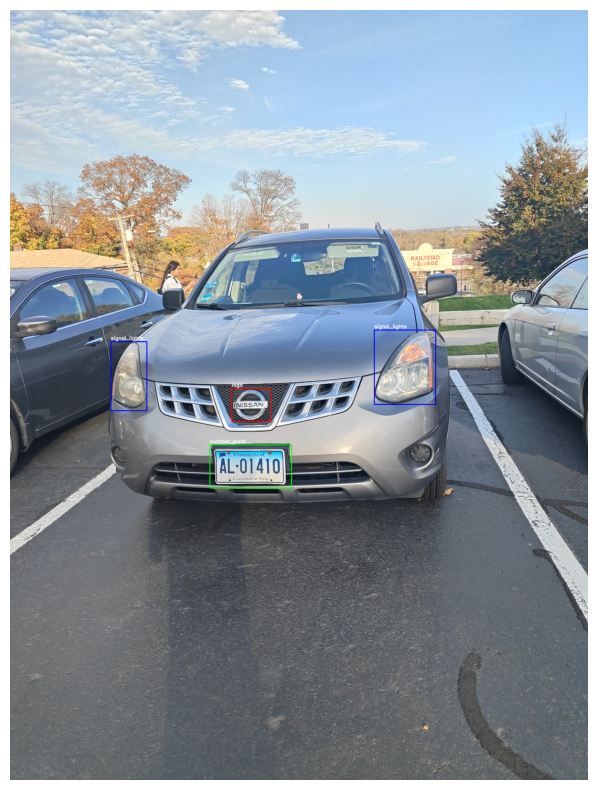

Searching for label file for Car103.jpg
Expected label: Car103.txt
Visualizing Car103.jpg in train split


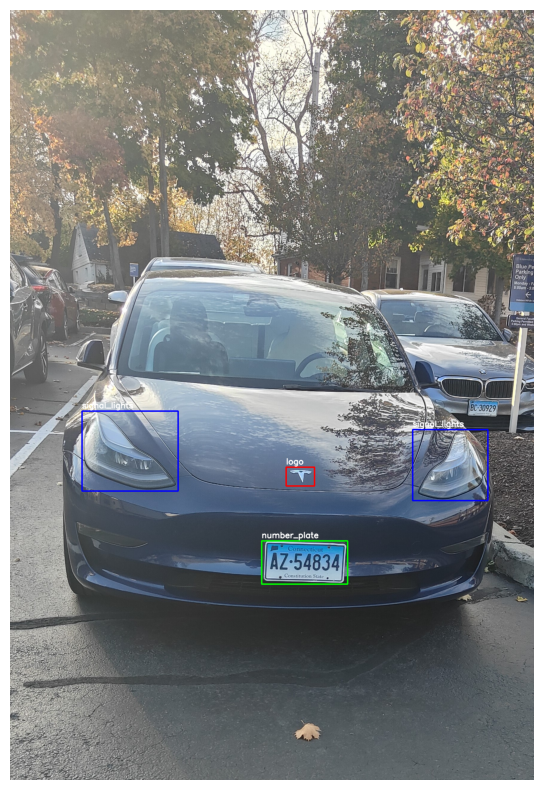

Searching for label file for Car104.jpg
Expected label: Car104.txt
Visualizing Car104.jpg in train split


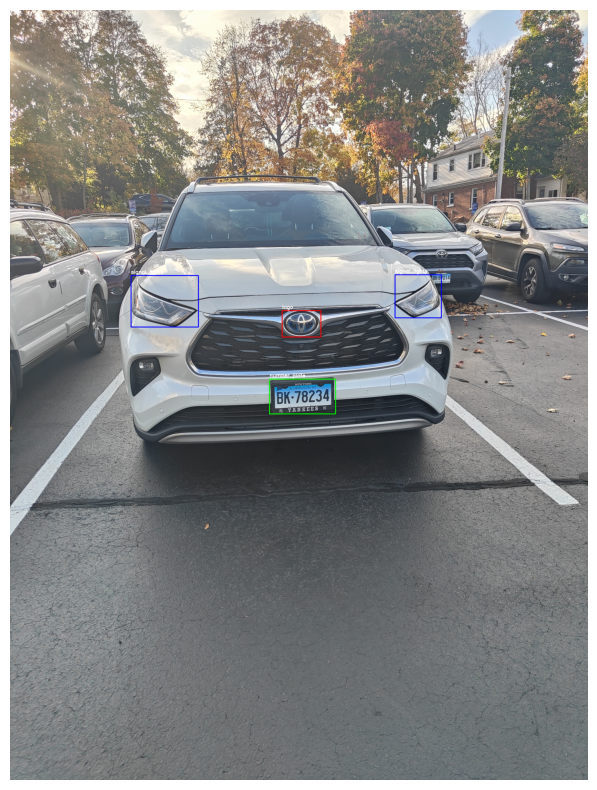

Searching for label file for Car107.jpg
Expected label: Car107.txt
Visualizing Car107.jpg in train split


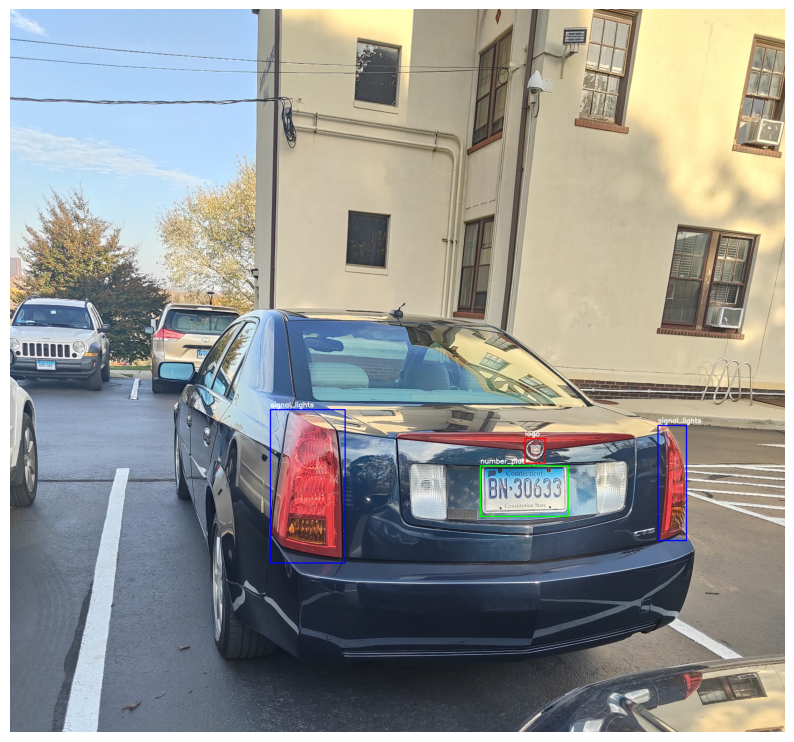

Searching for label file for Car108.jpg
Expected label: Car108.txt
Visualizing Car108.jpg in train split


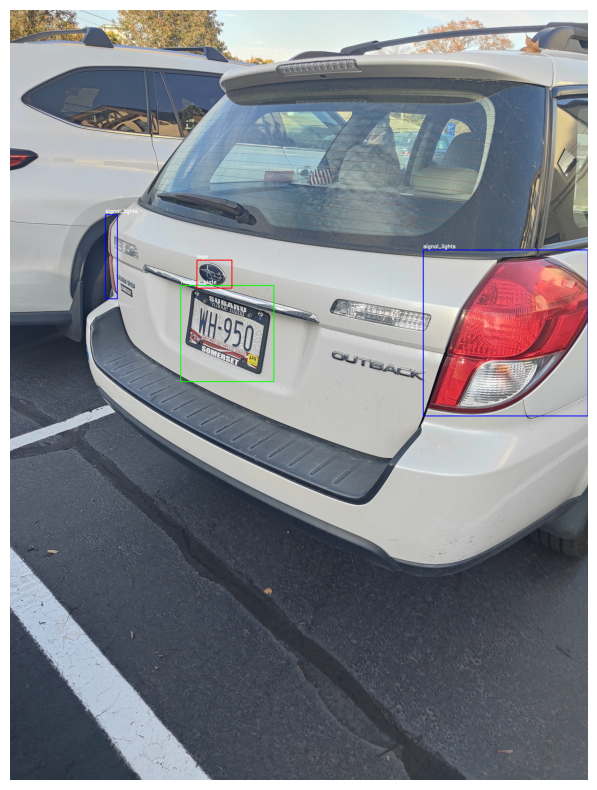

Searching for label file for Car109.jpg
Expected label: Car109.txt
Visualizing Car109.jpg in train split


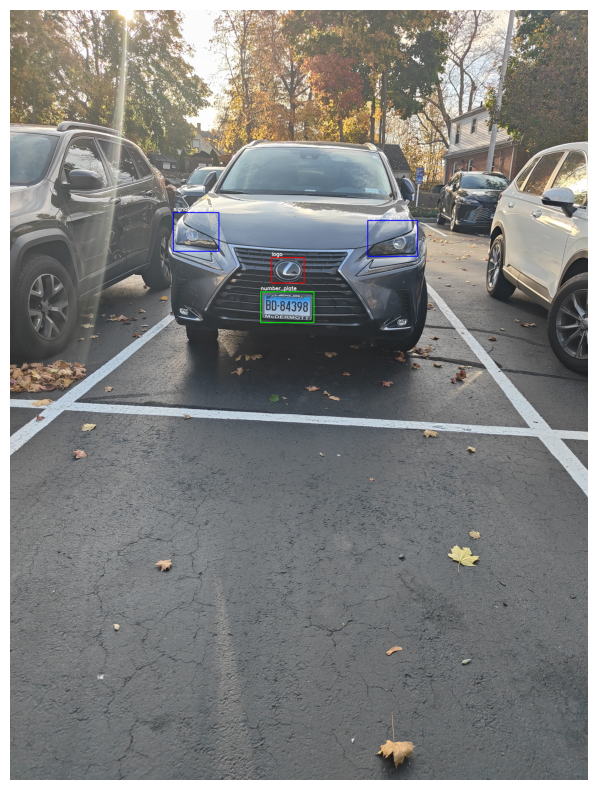

Searching for label file for Car11.jpg
Expected label: Car11.txt
Visualizing Car11.jpg in train split


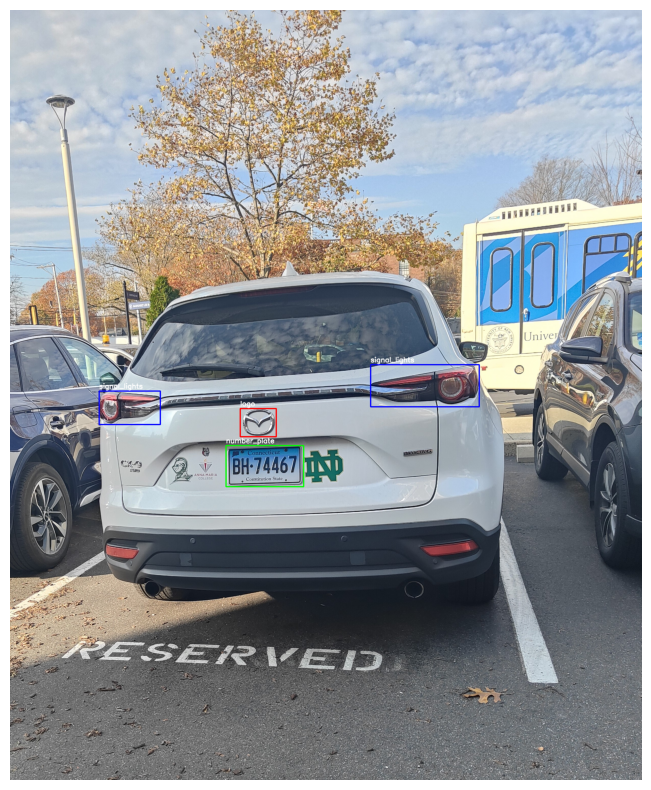

Displayed 10 images from the train split.


In [191]:
import cv2
import os
import matplotlib.pyplot as plt

# Define paths to dataset directories
base_dir = r"C:\SEM_3\prjt\yolo_object_detection\Notes\1_datapreparation\dataset"  # Path to dataset
splits = ['train', 'val', 'test']
display_limit = 10  # Set the limit for the number of images to display

# Class names (adjust this according to your dataset)
class_names = {0: 'number_plate', 1: 'logo', 2: 'signal_lights'}  # Example classes

# Assign unique colors to each class for bounding boxes
colors = {
    0: (0, 255, 0),  # Green for 'number_plate'
    1: (255, 0, 0),  # Blue for 'logo'
    2: (0, 0, 255)   # Red for 'signal_lights'
}

# Function to visualize labels on a single image with class name and high quality
def visualize_yolo_labels(image_path, label_path):
    # Read the image with high resolution
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for better display
    image_height, image_width = image.shape[:2]

    # Check if label file exists
    if not os.path.exists(label_path):
        print(f"No label file for {image_path}")
        return

    # Load YOLO labels
    with open(label_path, 'r') as file:
        lines = file.readlines()

    # Draw bounding boxes
    for line in lines:
        # Parse YOLO format (class_id, center_x, center_y, width, height)
        class_id, center_x, center_y, w, h = map(float, line.strip().split())

        # Convert normalized coordinates to pixel values
        center_x *= image_width
        center_y *= image_height
        w *= image_width
        h *= image_height

        # Calculate bounding box coordinates
        x_min = int(center_x - w / 2)
        y_min = int(center_y - h / 2)
        x_max = int(center_x + w / 2)
        y_max = int(center_y + h / 2)

        # Draw the rectangle on the image with a unique color for each class
        color = colors.get(int(class_id), (255, 255, 255))  # Default to white if not found
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), color, 3)

        # Get the class name from the class_id
        class_name = class_names.get(int(class_id), 'Unknown')  # Default to 'Unknown' if not found

        # Add the class name text above the bounding box
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(image, class_name, (x_min, y_min - 10), font, 0.9, (255, 255, 255), 2, cv2.LINE_AA)

    # Display the image with bounding boxes and class names
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Loop through each dataset split
for split in splits:
    image_dir = os.path.join(base_dir, split)  # Folder containing the images and txt label files
    displayed_count = 0  # Counter for displayed images

    print(f"Processing split: {split}")

    # Process each image in the split folder
    for image_filename in os.listdir(image_dir):
        if image_filename.endswith(('.jpg', '.jpeg', '.png')):  # Check if file is an image
            image_path = os.path.join(image_dir, image_filename)

            # Construct the corresponding label filename (same name, .txt extension)
            label_filename = os.path.splitext(image_filename)[0] + '.txt'

            # Debugging: Print the image and label being searched for
            print(f"Searching for label file for {image_filename}")
            print(f"Expected label: {label_filename}")

            # Check if the corresponding label file exists
            label_path = os.path.join(image_dir, label_filename)

            if not os.path.exists(label_path):
                print(f"No label file found for {image_filename}. Skipping.")
                continue  # Skip this image if no label file is found

            # Visualize the image and labels
            print(f"Visualizing {image_filename} in {split} split")
            visualize_yolo_labels(image_path, label_path)
            
            # Increment the displayed count and check if limit is reached
            displayed_count += 1
            if displayed_count >= display_limit:
                print(f"Displayed {display_limit} images from the {split} split.")
                break
    if displayed_count >= display_limit:
        break  # Exit outer loop if the display limit is reached
